# Data Mining: Harry Potter Sorting Hat
Studente: Aloisio Chiara Ludovica
Matricola: 239648
A/A: 2024/2025

---


# Setup
Come prima cosa, assicuriamoci che il seguente notebook funzioni sia con python 2 che 3, importiamo alcuni moduli di utilità e prepariamo le funzioni per salvare le immagini

In [24]:
# Python ≥3.5 is required
import sys

from sklearn.metrics import accuracy_score

assert sys.version_info >= (3, 5)

# Scikit-Learn ≥0.20 is required
import sklearn
assert sklearn.__version__ >= "0.20"

# Common imports
import numpy as np
import os

#imports pandas
import pandas as pd
from IPython.display import Image
import os
#import warnings and Repress Warnings
import warnings
warnings.filterwarnings("ignore", message="numpy.dtype size changed")
warnings.filterwarnings("ignore", message="numpy.ufunc size changed")
warnings.filterwarnings("ignore", message="numpy.ndarray size changed")
warnings.filterwarnings('ignore')

# to make this notebook's output stable across runs
np.random.seed(42)

# To plot pretty figures
%matplotlib inline
import matplotlib as mpl
import matplotlib.pyplot as plt
import seaborn as sns
sns.set(style="whitegrid") #White Grid
mpl.rc('axes', labelsize=14)
mpl.rc('xtick', labelsize=12)
mpl.rc('ytick', labelsize=12)

# Where to save the figures
PROJECT_ROOT_DIR = "."
CHAPTER_ID= "Harry-Potter"
IMAGES_PATH = os.path.join(PROJECT_ROOT_DIR, "images")
os.makedirs(IMAGES_PATH, exist_ok=True)

def save_fig(fig_id, tight_layout=True, fig_extension="png", resolution=400):
    path = os.path.join(IMAGES_PATH, fig_id + "." + fig_extension)
    print("Saving figure", fig_id)
    if tight_layout:
        plt.tight_layout()
    plt.savefig(path, format=fig_extension, dpi=resolution)

def save_figure(figure, fig_id, tight_layout=False, fig_extension="png", resolution=400):
    path = os.path.join(IMAGES_PATH, fig_id + "." + fig_extension)
    print("Saving figure", fig_id)
    if tight_layout:
        plt.tight_layout()
    figure.savefig(path, format=fig_extension, dpi=resolution)

# Ignore useless warnings (see SciPy issue #5998)
import warnings
warnings.filterwarnings(action="ignore", message="^internal gelsd")
import warnings
warnings.filterwarnings('ignore')

# Hrule--> "====="
hrule = lambda x : "="*x
Hrule = lambda x,y: "="*(x//2)+y+"="*(x//2)

---

# Motivazione dello studio
Harry Potter è una serie di romanzi fantasy scritta da J.K. Rowling che segue le avventure di un giovane mago, Harry, mentre frequenta la Scuola di Magia e Stregoneria di Hogwarts e affronta il potente mago oscuro Lord Voldemort.

In [25]:
from IPython.display import Image
Image(url="https://cdn.wallpapersafari.com/39/28/s9IzxG.jpg", width=800)


Come sceglie le casate il Cappello Parlante?
Il Cappello Parlante è un cappello magico che smista gli studenti nelle quattro casate di Hogwarts: Grifondoro, Serpeverde, Corvonero e Tassorosso. Durante la Cerimonia di Smistamento, il cappello viene posto sulla testa dello studente e legge nella sua mente desideri, qualità e potenziale. In base a ciò che trova, decide la casata più adatta. Si basa principalmete su alcune caratteristiche più rilevanti quali, ad esempio l'eredità genetica dei genitori, il coraggio, l'inelligenza, la lealtà, l'ambizione, la conoscenza delle arti oscure, abilità el giocare a quidditch, abilità nei duelli e creatività.

In [26]:
from IPython.display import Image
Image(url="https://th.bing.com/th/id/OIP.gfkCacIGJu_4w9Q08F8G9gHaFu?rs=1&pid=ImgDetMain", width=800)


L'obiettivo del seguente studio sarà, dunque, dopo aver studiato il dataset, quello di predire la casata di uno studente della scuola di magia e stregoneria di Hogwarts attraverso modelli di multi classificazione.

---

# Pre processing
In questa prima parta andiamo a caricare i dati che verranno sottoposti a delle prime analisi di tipo strutturale che necesariamente porteranno all'individuazione di alcune trasformazioni necessarie per il proseguo delle analisi.

In [27]:
df = pd.read_csv("harry_potter_students_enriched.csv")
pd.set_option('display.max_columns', None)
print(df.columns)

df.head
print(df.shape)

Index(['Blood Status', 'Bravery', 'Intelligence', 'Loyalty', 'Ambition',
       'Dark Arts Knowledge', 'Quidditch Skills', 'Dueling Skills',
       'Creativity', 'House', 'id', 'name', 'surname', 'age'],
      dtype='object')
(20000, 14)


Vediamo le informazioni sul dataset

In [28]:
df.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 20000 entries, 0 to 19999
Data columns (total 14 columns):
 #   Column               Non-Null Count  Dtype  
---  ------               --------------  -----  
 0   Blood Status         15059 non-null  object 
 1   Bravery              15043 non-null  float64
 2   Intelligence         15019 non-null  float64
 3   Loyalty              15088 non-null  float64
 4   Ambition             15005 non-null  float64
 5   Dark Arts Knowledge  14964 non-null  float64
 6   Quidditch Skills     15089 non-null  float64
 7   Dueling Skills       15038 non-null  float64
 8   Creativity           14995 non-null  float64
 9   House                15049 non-null  object 
 10  id                   20000 non-null  int64  
 11  name                 19054 non-null  object 
 12  surname              19392 non-null  object 
 13  age                  17944 non-null  float64
dtypes: float64(9), int64(1), object(4)
memory usage: 2.1+ MB


Il comando `df.info()` mostra che il DataFrame ha 20.000 righe e 10 colonne. Otto colonne contengono dati numerici (`float64`) come Bravery, Intelligence, ecc., mentre due sono di tipo `object` (probabilmente stringhe), come Blood Status e House.
Tutte le colonne hanno valori mancanti, quindi sarà necessario gestire i `NaN`. La memoria usata è circa **1.5 MB**.
Iniziamo dunque i primi lavori di trasformazione del dataset, gestendo i valori NaN e eventuali duplicati al fine di aiutare la valutazione dei vari algoritmi.



Iniziamo eliminand i duplicati

In [29]:
df.drop_duplicates(keep='first', inplace=True)
print(df.shape)

(20000, 14)


Eliminiamo le colonne che no ci servono, nel nostro caso id:

In [30]:
#Scrivere codice
df.drop('id', axis=1, inplace=True)
df.drop('name', axis=1, inplace=True)

df.head()

,Blood Status,Bravery,Intelligence,Loyalty,Ambition,Dark Arts Knowledge,Quidditch Skills,Dueling Skills,Creativity,House,surname,age
0,Pure-blood,NaN,NaN,NaN,NaN,7.0,NaN,8.0,NaN,NaN,Blackwood,NaN
1,Muggle-born,3.0,7.0,6.0,2.0,5.0,3.0,3.0,10.0,Ravenclaw,Blackwood,18.0
2,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,Blackwood,18.0
3,Muggle-born,2.0,9.0,1.0,2.0,3.0,0.0,5.0,8.0,Ravenclaw,Blackwood,13.0
4,NaN,NaN,NaN,9.0,2.0,NaN,1.0,NaN,NaN,NaN,Blackwood,17.0


Andiamo ora a gestire i valori NaN:



In [31]:
df.isnull().sum()

Blood Status           4941
Bravery                4957
Intelligence           4981
Loyalty                4912
Ambition               4995
Dark Arts Knowledge    5036
Quidditch Skills       4911
Dueling Skills         4962
Creativity             5005
House                  4951
surname                 608
age                    2056
dtype: int64

Decido di voler predire i NaN usando il modello KNN imputer, ma prima devo effettuare alcune conversioni:


In [32]:
# One-Hot Encoding per "Blood Status"
df = pd.get_dummies(df, columns=['Blood Status'], drop_first=False)

print(df)


        Bravery  Intelligence   Loyalty   Ambition  Dark Arts Knowledge  \
0           NaN           NaN       NaN        NaN             7.000000   
1       3.00000      7.000000  6.000000   2.000000             5.000000   
2           NaN           NaN       NaN        NaN                  NaN   
3       2.00000      9.000000  1.000000   2.000000             3.000000   
4           NaN           NaN  9.000000   2.000000                  NaN   
...         ...           ...       ...        ...                  ...   
19995       NaN           NaN  8.000000        NaN                  NaN   
19996       NaN           NaN       NaN   5.000000                  NaN   
19997   4.00000      9.000000  4.000000   3.000000             5.000000   
19998   4.00000      2.000000  5.000000   8.000000            10.000000   
19999  31.31871     14.538282  7.427434  35.644628            52.314971   

       Quidditch Skills  Dueling Skills  Creativity      House    surname  \
0                   Na

In [33]:
# One-Hot Encoding per "House"
df = pd.get_dummies(df, columns=['House'], drop_first=False)


# One-Hot Encoding per "Surname"
df = pd.get_dummies(df, columns=['surname'], drop_first=False)

print(df)


        Bravery  Intelligence   Loyalty   Ambition  Dark Arts Knowledge  \
0           NaN           NaN       NaN        NaN             7.000000   
1       3.00000      7.000000  6.000000   2.000000             5.000000   
2           NaN           NaN       NaN        NaN                  NaN   
3       2.00000      9.000000  1.000000   2.000000             3.000000   
4           NaN           NaN  9.000000   2.000000                  NaN   
...         ...           ...       ...        ...                  ...   
19995       NaN           NaN  8.000000        NaN                  NaN   
19996       NaN           NaN       NaN   5.000000                  NaN   
19997   4.00000      9.000000  4.000000   3.000000             5.000000   
19998   4.00000      2.000000  5.000000   8.000000            10.000000   
19999  31.31871     14.538282  7.427434  35.644628            52.314971   

       Quidditch Skills  Dueling Skills  Creativity   age  \
0                   NaN        8.00000

In [34]:
from sklearn.impute import KNNImputer
# Creiamo un oggetto KNNImputer
knn_imputer = KNNImputer(n_neighbors=2)  # 'n_neighbors' è il numero di vicini da considerare

# Applichiamo KNNImputer al DataFrame
df = pd.DataFrame(knn_imputer.fit_transform(df), columns=df.columns)

# Mostriamo il risultato
print(df)

        Bravery  Intelligence   Loyalty   Ambition  Dark Arts Knowledge  \
0       5.00000      3.000000  5.000000   5.500000             7.000000   
1       3.00000      7.000000  6.000000   2.000000             5.000000   
2       6.00000      4.000000  5.500000   5.500000             7.000000   
3       2.00000      9.000000  1.000000   2.000000             3.000000   
4       4.50000      3.500000  9.000000   2.000000             4.500000   
...         ...           ...       ...        ...                  ...   
19995   5.50000      6.500000  8.000000   5.000000             3.000000   
19996   3.50000      5.000000  8.500000   5.000000             2.500000   
19997   4.00000      9.000000  4.000000   3.000000             5.000000   
19998   4.00000      2.000000  5.000000   8.000000            10.000000   
19999  31.31871     14.538282  7.427434  35.644628            52.314971   

       Quidditch Skills  Dueling Skills  Creativity   age  \
0              7.500000        8.00000

Ho sovrascritto il dataset con i miei valori aggiornati. Infatti:

In [35]:
df.isnull().sum()

Bravery                     0
Intelligence                0
Loyalty                     0
Ambition                    0
Dark Arts Knowledge         0
Quidditch Skills            0
Dueling Skills              0
Creativity                  0
age                         0
Blood Status_Half-blood     0
Blood Status_Muggle-born    0
Blood Status_Pure-blood     0
House_Gryffindor            0
House_Hufflepuff            0
House_Ravenclaw             0
House_Slytherin             0
surname_Ashcroft            0
surname_Blackwood           0
surname_Brightmoor          0
surname_Coldmarsh           0
surname_Darkwater           0
surname_Duskryn             0
surname_Duskwatch           0
surname_Emberlain           0
surname_Emberwyld           0
surname_Everbleed           0
surname_Falconshade         0
surname_Flintveil           0
surname_Frostbane           0
surname_Graves              0
surname_Hawkwind            0
surname_Ironhart            0
surname_Moonvale            0
surname_Ni

ora effettivamente non ho più valori null.

Andiamo dunque a normalizzare tutti i valori. Scelgo la normalizzazione Min-Max Scaling perchè ho bisogno che i miei valori esistano in un range strettamente definito. Prima, per un eccesso di zelo, voglio controllare la non presenza di outliers:

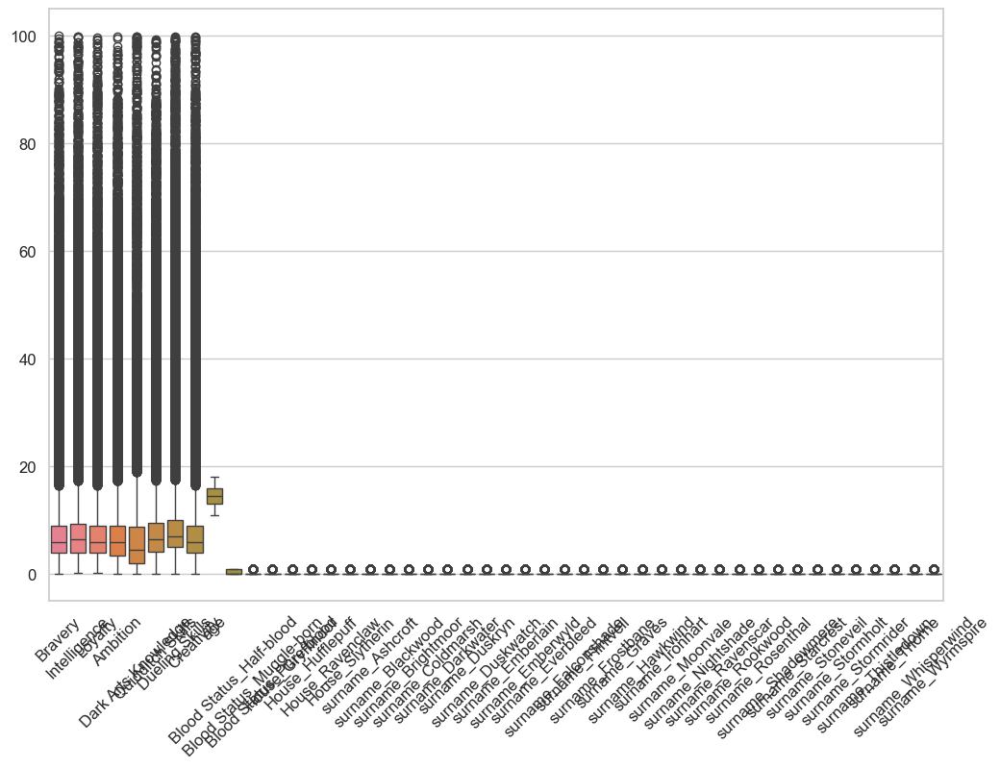

In [36]:
numeric_columns = df.select_dtypes(include=['float64', 'int64']).columns

# Creare un boxplot per ogni colonna numerica
plt.figure(figsize=(12, 8))  # Impostiamo una dimensione per il grafico
sns.boxplot(data=df[numeric_columns])

# Mostrare il grafico
plt.xticks(rotation=45)  # Ruotiamo le etichette se necessario
plt.show()

Contro ogni aspettativa, ho molti outliers, dunque eseguo standardizzaione tramite Z-Score

In [37]:
from sklearn.preprocessing import StandardScaler

# Creiamo un oggetto StandardScaler
scaler = StandardScaler()

# Applichiamo la standardizzazione
df_standardized = pd.DataFrame(scaler.fit_transform(df), columns=df.columns)

# Mostriamo il risultato
print(df_standardized)

        Bravery  Intelligence   Loyalty  Ambition  Dark Arts Knowledge  \
0     -0.402241     -0.560620 -0.419303 -0.368693            -0.132457   
1     -0.538115     -0.299176 -0.352275 -0.604615            -0.279449   
2     -0.334304     -0.495259 -0.385789 -0.368693            -0.132457   
3     -0.606053     -0.168455 -0.687412 -0.604615            -0.426442   
4     -0.436210     -0.527939 -0.151193 -0.604615            -0.316197   
...         ...           ...       ...       ...                  ...   
19995 -0.368272     -0.331857 -0.218221 -0.402396            -0.426442   
19996 -0.504147     -0.429898 -0.184707 -0.402396            -0.463190   
19997 -0.470178     -0.168455 -0.486330 -0.537209            -0.279449   
19998 -0.470178     -0.625981 -0.419303 -0.200177             0.088032   
19999  1.385778      0.193532 -0.256598  1.663249             3.198022   

       Quidditch Skills  Dueling Skills  Creativity       age  \
0             -0.282236       -0.312634   -0.3

---

# Visualizazion


In [38]:
import seaborn as sns

# Pairplot del dataset (mostra scatter plot e distribuzioni per ogni variabile)
sns.pairplot(df)

# Mostrare il grafico
plt.show()


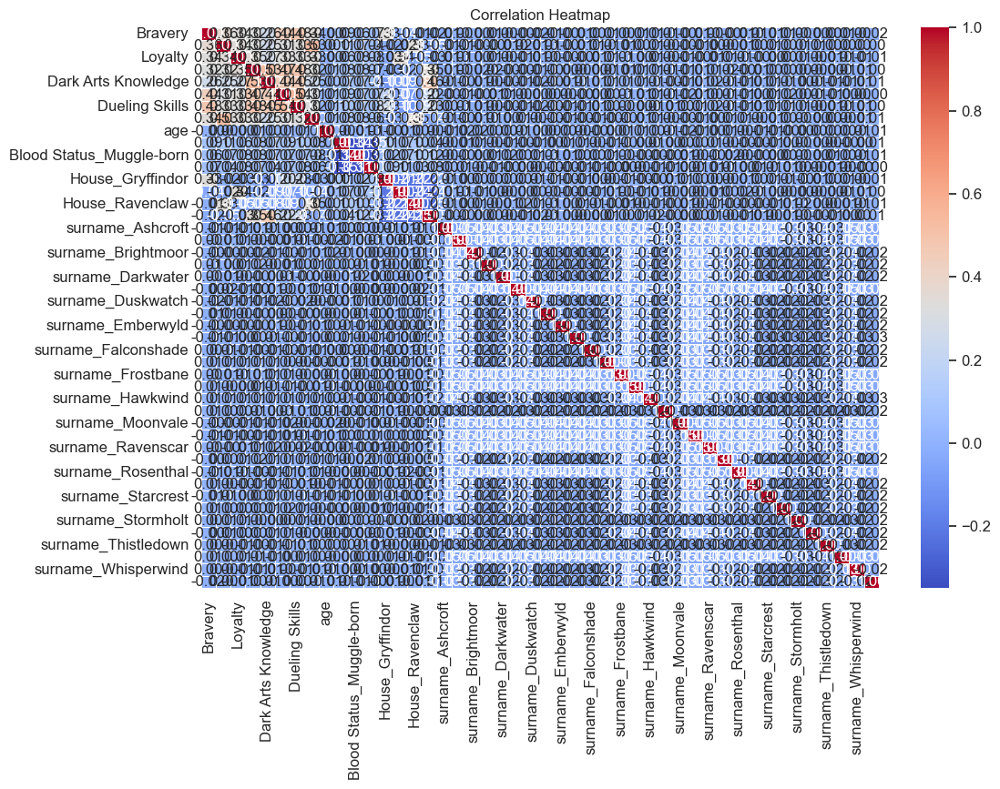

In [39]:
import seaborn as sns

# Calcolare la matrice di correlazione
corr_matrix = df.corr()

# Creare una heatmap della matrice di correlazione
plt.figure(figsize=(12, 8))
sns.heatmap(corr_matrix, annot=True, cmap='coolwarm', fmt='.2f', linewidths=0.5)

# Mostrare il grafico
plt.title('Correlation Heatmap')
plt.show()

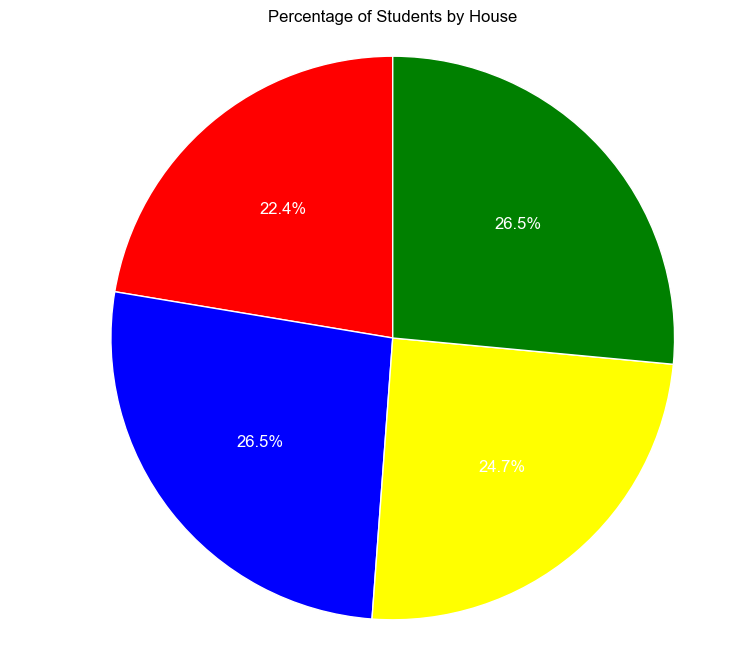

In [40]:
# Sommare i valori di ciascuna colonna per ottenere il numero di studenti per ogni casata
house_counts = df[['House_Gryffindor', 'House_Ravenclaw', 'House_Hufflepuff', 'House_Slytherin']].sum()

# Definire i colori per ciascuna casata
colors = ['red', 'blue', 'yellow', 'green']  # rosso per Gryffindor, blu per Ravenclaw, giallo per Hufflepuff, verde per Slytherin

# Creare il grafico a torta
plt.figure(figsize=(8, 8))
plt.pie(house_counts, labels=house_counts.index, autopct='%1.1f%%', startangle=90, colors=colors, textprops={'color': 'white'})

# Aggiungere un titolo
plt.title('Percentage of Students by House', color='black')

# Mostrare il grafico
plt.axis('equal')  # Assicurarsi che il grafico sia circolare
plt.show()



Per comodità, vado ad unire le case sotto un'unica colonna

In [41]:
# 1. Conversione da colonne binarie a colonna singola 'House'
house_cols = ["House_Gryffindor", "House_Slytherin", "House_Ravenclaw", "House_Hufflepuff"]
df["House"] = df[house_cols].idxmax(axis=1)

# (Facoltativo) Rimuovi le colonne binarie se non servono più
df.drop(columns=house_cols, inplace=True)

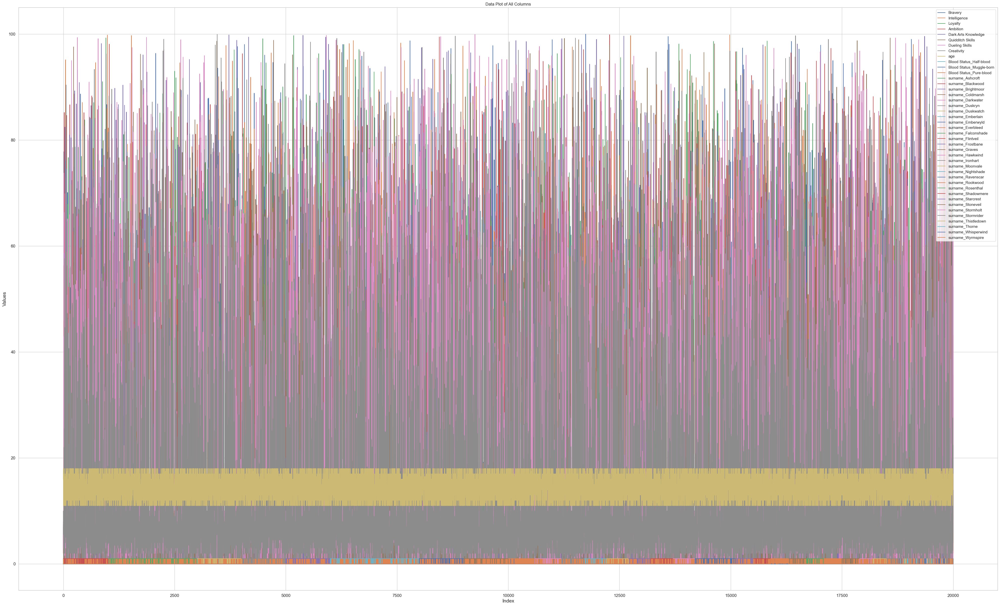

In [42]:
import matplotlib.pyplot as plt

# Plottare ogni colonna numerica nel dataset
df.plot(figsize=(50, 30))  # Impostiamo una dimensione per il grafico

# Mostrare il grafico
plt.title('Data Plot of All Columns')
plt.xlabel('Index')
plt.ylabel('Values')
plt.show()

#fare un plot per ogni colonna del df

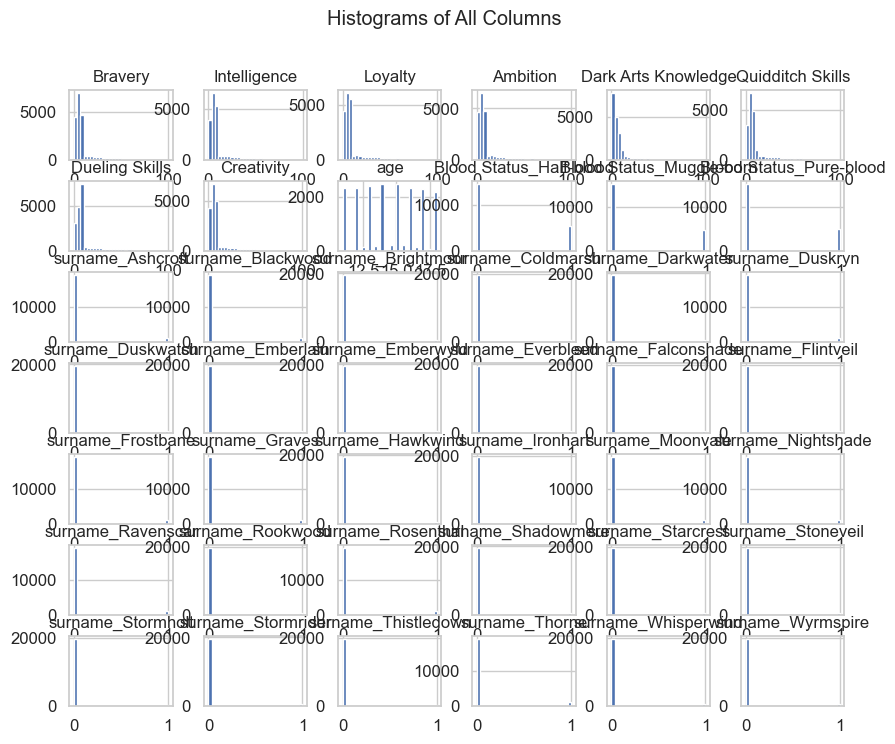

In [43]:
# Creiamo un istogramma per ogni colonna numerica
df.hist(figsize=(10, 8), bins=30)  # Impostiamo una dimensione e il numero di bin

# Mostriamo il grafico
plt.suptitle('Histograms of All Columns')
plt.show()


---

# non so che cosa fare ora :)

In [44]:
df.info


<bound method DataFrame.info of         Bravery  Intelligence   Loyalty   Ambition  Dark Arts Knowledge  \
0       5.00000      3.000000  5.000000   5.500000             7.000000   
1       3.00000      7.000000  6.000000   2.000000             5.000000   
2       6.00000      4.000000  5.500000   5.500000             7.000000   
3       2.00000      9.000000  1.000000   2.000000             3.000000   
4       4.50000      3.500000  9.000000   2.000000             4.500000   
...         ...           ...       ...        ...                  ...   
19995   5.50000      6.500000  8.000000   5.000000             3.000000   
19996   3.50000      5.000000  8.500000   5.000000             2.500000   
19997   4.00000      9.000000  4.000000   3.000000             5.000000   
19998   4.00000      2.000000  5.000000   8.000000            10.000000   
19999  31.31871     14.538282  7.427434  35.644628            52.314971   

       Quidditch Skills  Dueling Skills  Creativity   age  \
0     

import matplotlib.pyplot as plt
import seaborn as sns

# Stile dei grafici
sns.set(style="whitegrid")
plt.rcParams["figure.figsize"] = (10, 6)

fig, axs = plt.subplots(3, 2, figsize=(18, 18))

# 1. Distribuzione per Casa
sns.countplot(data=df, x="House", ax=axs[0, 0], order=df["House"].value_counts().index)
axs[0, 0].set_title("Distribuzione per Casa")

# 2. Distribuzione del Blood Status
sns.countplot(data=df, x="Blood Status", ax=axs[0, 1], order=df["Blood Status"].value_counts().index)
axs[0, 1].set_title("Distribuzione del Blood Status")

# 3. Istogramma delle età
sns.histplot(data=df, x="age", bins=10, kde=True, ax=axs[1, 0], color="orange")
axs[1, 0].set_title("Distribuzione dell'età")

# 4. Matrice di correlazione
corr = df.select_dtypes(include='number').corr()
sns.heatmap(corr, annot=True, cmap="coolwarm", ax=axs[1, 1])
axs[1, 1].set_title("Matrice di Correlazione")

# 5. Boxplot dei tratti principali per Casa
sns.boxplot(data=df, x="House", y="Intelligence", ax=axs[2, 0])
axs[2, 0].set_title("Intelligenza per Casa")

# 6. Distribuzione della conoscenza delle Arti Oscure per Casa
sns.violinplot(data=df, x="House", y="Dark Arts Knowledge", ax=axs[2, 1])
axs[2, 1].set_title("Conoscenza Arti Oscure per Casa")

plt.tight_layout()
plt.show()



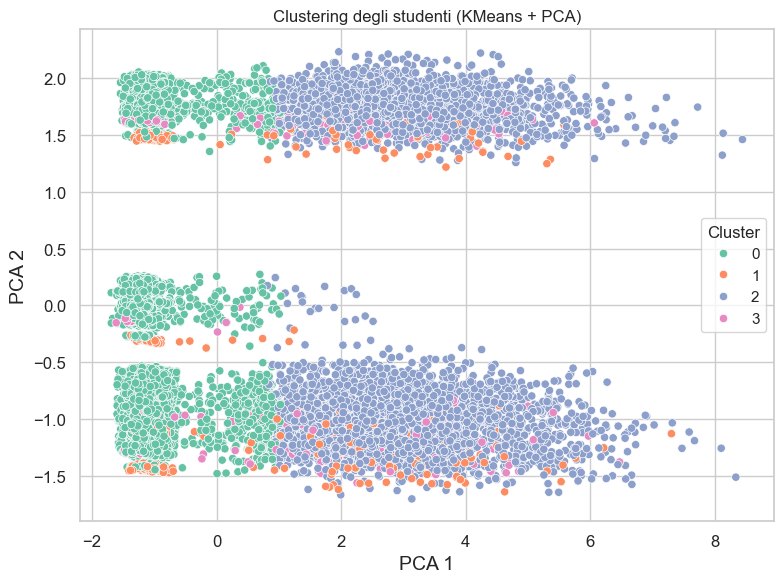


--- CLASSIFICATION REPORT (Casa) ---
                  precision    recall  f1-score   support

House_Gryffindor       0.91      0.93      0.92      1650
House_Hufflepuff       0.89      0.85      0.87       757
 House_Ravenclaw       0.87      0.90      0.89       751
 House_Slytherin       0.93      0.89      0.91       842

        accuracy                           0.90      4000
       macro avg       0.90      0.89      0.90      4000
    weighted avg       0.90      0.90      0.90      4000



In [45]:
import pandas as pd
from sklearn.preprocessing import StandardScaler, LabelEncoder
from sklearn.decomposition import PCA
from sklearn.cluster import KMeans
from sklearn.ensemble import RandomForestClassifier
from sklearn.model_selection import train_test_split
from sklearn.metrics import classification_report
import matplotlib.pyplot as plt
import seaborn as sns


# ---- Pulizia e preprocessing ----
# Rimuovo colonne non informative (es. nome)
df_clean = df.drop(columns=["Name"], errors='ignore')

# Encoding variabili categoriche
categorical_cols = df_clean.select_dtypes(include='object').columns
le_dict = {}

for col in categorical_cols:
    le = LabelEncoder()
    df_clean[col] = df_clean[col].astype(str)  # Evita NaN nei LabelEncoder
    df_clean[col] = le.fit_transform(df_clean[col])
    le_dict[col] = le

# ---- CLUSTERING STUDENTI ----
features_for_clustering = df_clean.drop(columns=["House"], errors='ignore')  # escludiamo la target
scaler = StandardScaler()
X_scaled = scaler.fit_transform(features_for_clustering)

# PCA per visualizzare in 2D
pca = PCA(n_components=2)
X_pca = pca.fit_transform(X_scaled)

# KMeans clustering
kmeans = KMeans(n_clusters=4, random_state=42)
clusters = kmeans.fit_predict(X_scaled)

# Aggiungiamo i cluster al dataframe per analisi
df['Cluster'] = clusters

# Plot dei cluster
plt.figure(figsize=(8, 6))
sns.scatterplot(x=X_pca[:, 0], y=X_pca[:, 1], hue=clusters, palette='Set2')
plt.title("Clustering degli studenti (KMeans + PCA)")
plt.xlabel("PCA 1")
plt.ylabel("PCA 2")
plt.legend(title="Cluster")
plt.tight_layout()
plt.show()

# ---- CLASSIFICAZIONE CASA ----
X = df_clean.drop(columns=["House"], errors='ignore')
y = df_clean["House"]

X_train, X_test, y_train, y_test = train_test_split(X, y, test_size=0.2, random_state=42)

model = RandomForestClassifier(n_estimators=100, random_state=42)
model.fit(X_train, y_train)

y_pred = model.predict(X_test)

print("\n--- CLASSIFICATION REPORT (Casa) ---")
print(classification_report(y_test, y_pred, target_names=le_dict["House"].classes_))


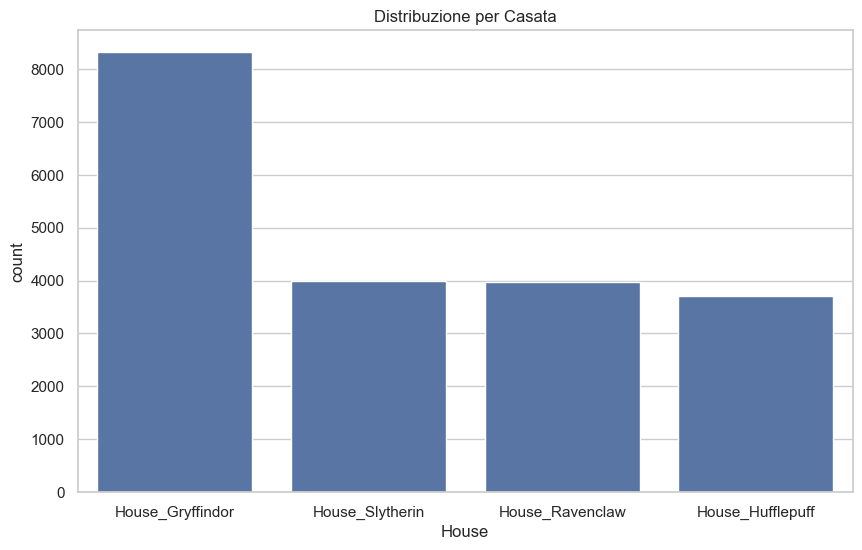

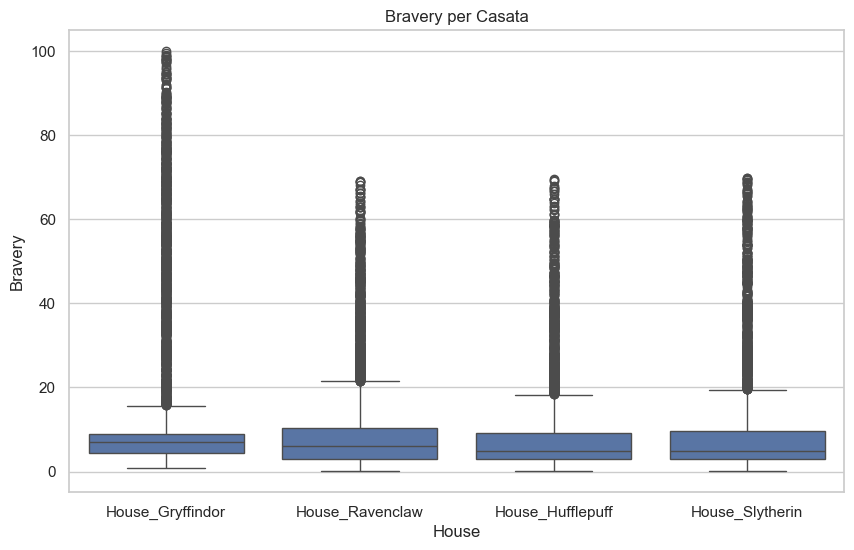

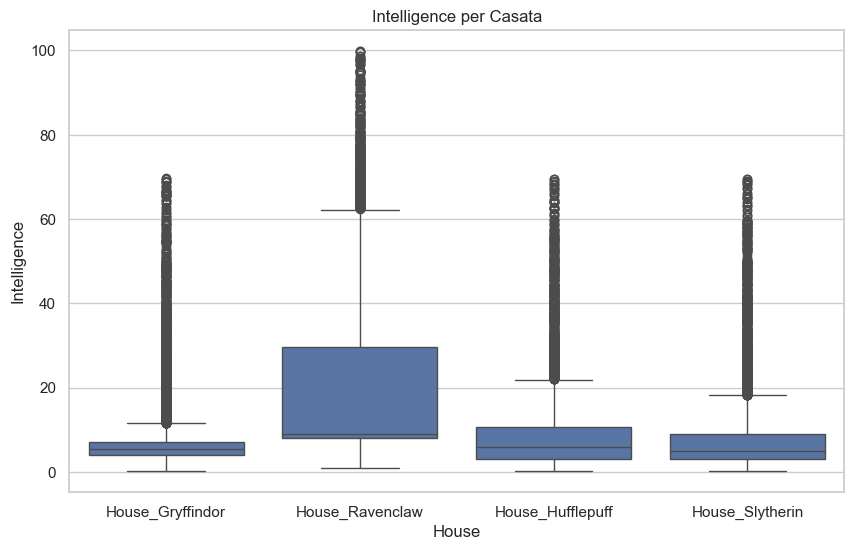

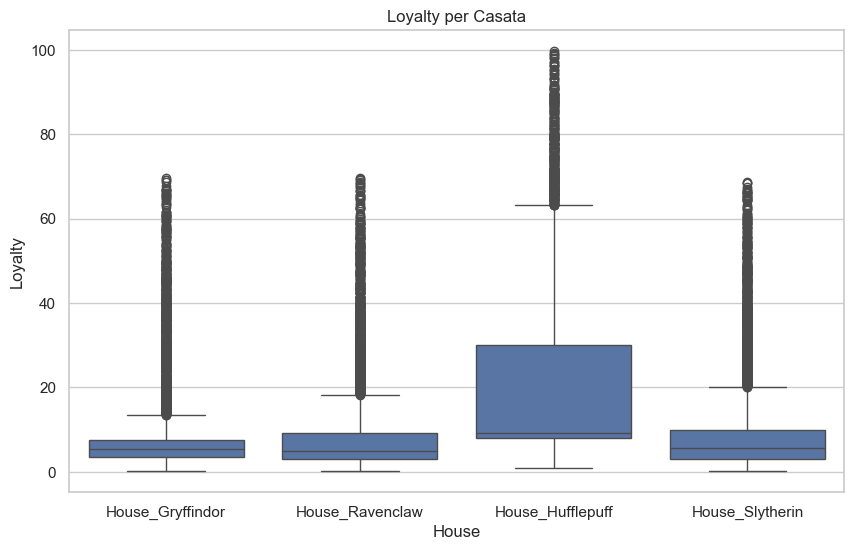

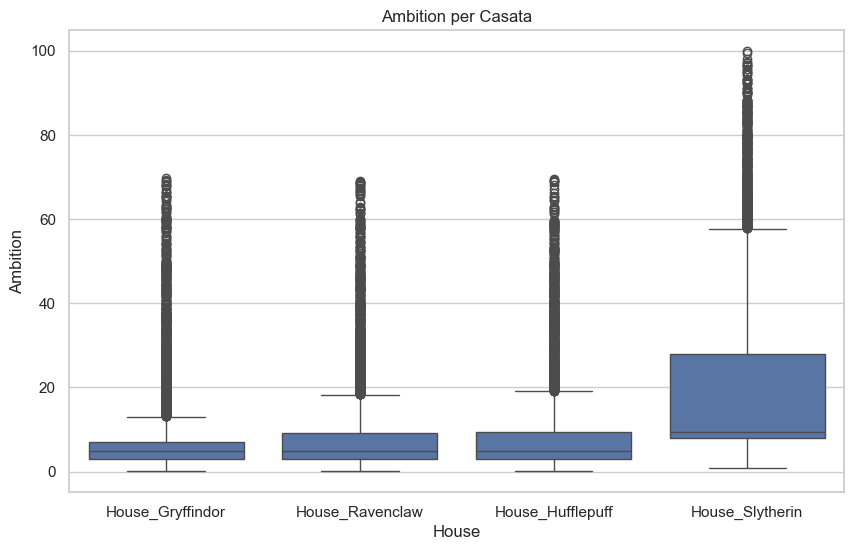

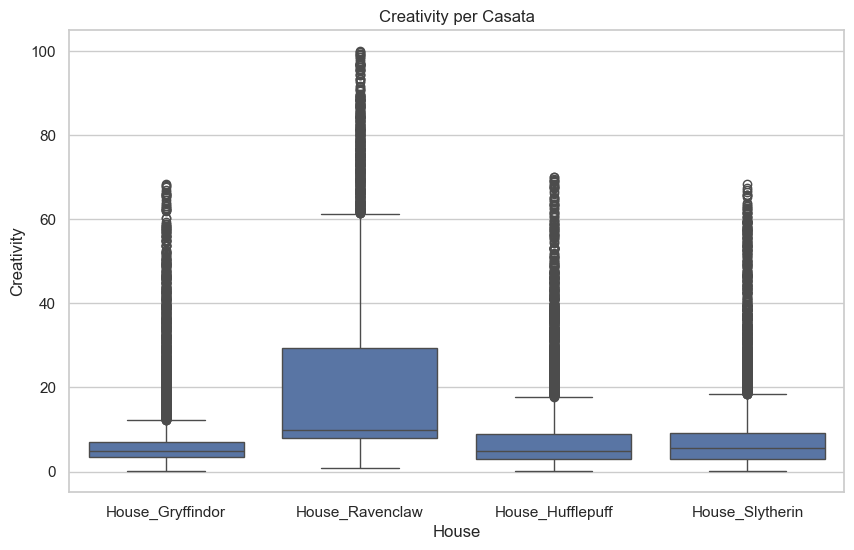

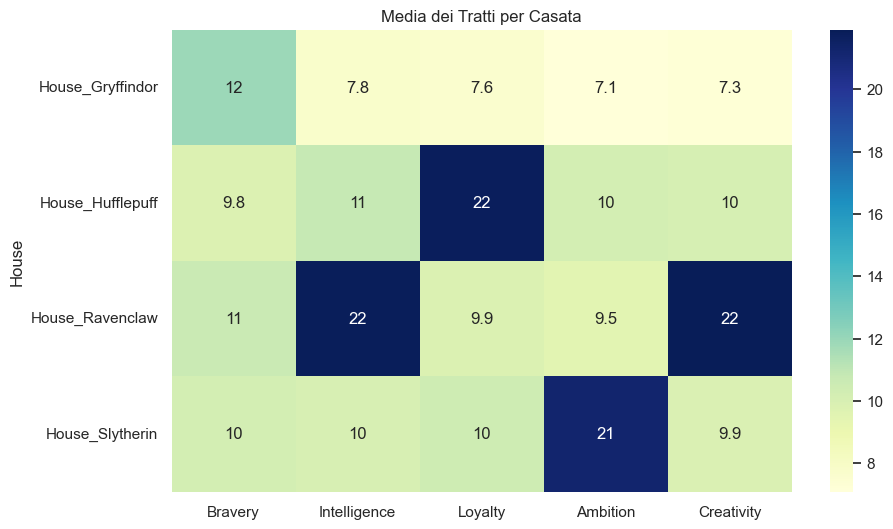

In [46]:
import pandas as pd
import matplotlib.pyplot as plt
import seaborn as sns

# Imposta stile grafico
sns.set(style="whitegrid")
plt.rcParams["figure.figsize"] = (10, 6)


# 2. Grafico: Distribuzione studenti per casata
plt.figure()
sns.countplot(data=df, x="House", order=df["House"].value_counts().index)
plt.title("Distribuzione per Casata")
plt.show()

# 3. Boxplot dei tratti per casata
traits = ["Bravery", "Intelligence", "Loyalty", "Ambition", "Creativity"]

for trait in traits:
    plt.figure()
    sns.boxplot(data=df, x="House", y=trait)
    plt.title(f"{trait} per Casata")
    plt.show()

# 4. Heatmap delle medie dei tratti per casata
mean_traits = df.groupby("House")[traits].mean()

plt.figure(figsize=(10, 6))
sns.heatmap(mean_traits, annot=True, cmap="YlGnBu")
plt.title("Media dei Tratti per Casata")
plt.show()

